# En este notebook se van a realizar pruebas con diferentes métodos de segmentación clásicos

## Segmentación por Umbralización



In [1]:
import cv2
import matplotlib
import numpy as np
from google.colab import files
import matplotlib.pyplot as plt
from itertools import combinations
from skimage.morphology import disk
from skimage.filters import gaussian
from skimage.util import img_as_ubyte
from skimage.segmentation import flood
from skimage import data, filters, morphology
from skimage.filters.rank import median, otsu
from skimage.segmentation import active_contour
from skimage.filters import threshold_otsu, rank

### Simple

Saving demo_umbralizacion.png to demo_umbralizacion.png


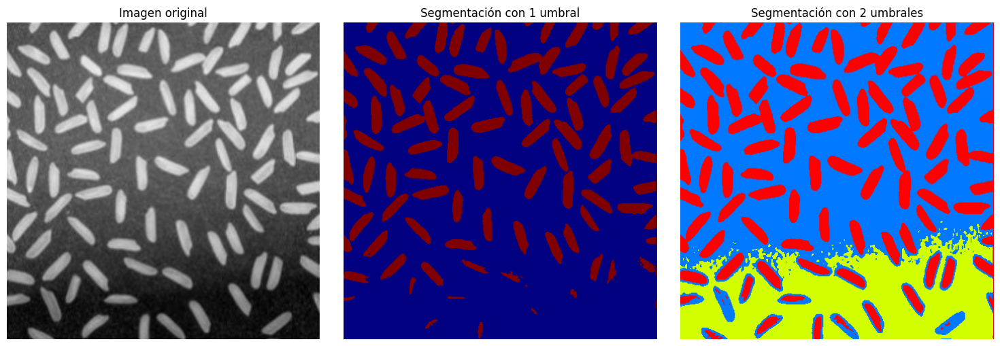

In [2]:
# Subir la imagen desde el sistema local
uploaded = files.upload()
# Leer el archivo subido
for filename in uploaded.keys():
    # Cargar la imagen en escala de grises
    img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

# Mostrar la imagen original
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Imagen original")
plt.imshow(img, cmap='gray')
plt.axis('off')

# Segmentación con un umbral
_, threshold_1 = cv2.threshold(img, 150, 255, cv2.THRESH_BINARY)

# Aplicar un colormap al resultado de la segmentación con un umbral
threshold_1_color = cv2.applyColorMap(threshold_1, cv2.COLORMAP_JET)

plt.subplot(1, 3, 2)
plt.title("Segmentación con 1 umbral")
plt.imshow(cv2.cvtColor(threshold_1_color, cv2.COLOR_BGR2RGB))  # Convertir a RGB para Matplotlib
plt.axis('off')

# Segmentación con dos umbrales
lower_bound = 60
upper_bound = 130
segmentation = np.zeros_like(img, dtype=np.uint8)

# Asignar colores únicos a cada rango
segmentation[img < lower_bound] = 50  # Región por debajo del umbral inferior
segmentation[(img >= lower_bound) & (img <= upper_bound)] = 150  # Región entre los umbrales
segmentation[img > upper_bound] = 255  # Región por encima del umbral superior

# Aplicar un colormap a la segmentación con dos umbrales
threshold_2_color = cv2.applyColorMap(segmentation, cv2.COLORMAP_HSV)

plt.subplot(1, 3, 3)
plt.title("Segmentación con 2 umbrales")
plt.imshow(cv2.cvtColor(threshold_2_color, cv2.COLOR_BGR2RGB))  # Convertir a RGB para Matplotlib
plt.axis('off')

# Mostrar los resultados
plt.tight_layout()
plt.show()

### Umbral global Básico

Saving demo_umbral_basico.png to demo_umbral_basico.png
Umbral inicial:  206.87
206.8745284583178
Umbral iter 1:  208.38
1.5043255753202516
Umbral iter 2:  209.68
1.3048553505524865
Umbral iter 3:  210.31


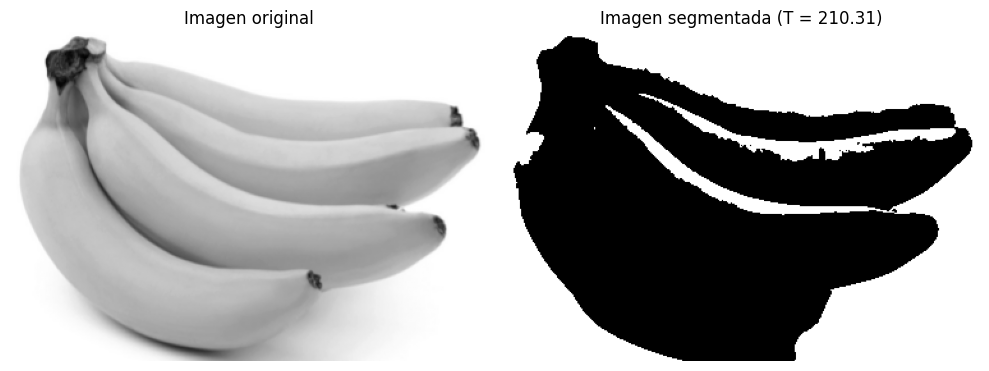

In [3]:
# Subir la imagen desde el sistema local
uploaded = files.upload()

# Leer la imagen en escala de grises
for filename in uploaded.keys():
    img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

# Mostrar la imagen original
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Imagen original")
plt.imshow(img, cmap='gray')
plt.axis('off')

# Función para calcular el umbral global básico
def global_thresholding(image, tolerance=1):
    # Paso 1: Seleccionar un umbral inicial (promedio de la imagen)
    T = np.mean(image)
    print("Umbral inicial: ", np.round(T,2))
    prev_T = 0  # Umbral anterior para comparar
    iteration = 1  # Contador de iteraciones

    while abs(T - prev_T) > tolerance:
        print(abs(T - prev_T))
        # Paso 2: Segmentar la imagen en dos grupos
        group1 = image[image > T]  # Píxeles mayores al umbral
        group2 = image[image <= T]  # Píxeles menores o iguales al umbral

        # Paso 3: Calcular las intensidades medias de cada grupo
        m1 = np.mean(group1) if len(group1) > 0 else 0
        m2 = np.mean(group2) if len(group2) > 0 else 0

        # Paso 4: Calcular un nuevo umbral
        prev_T = T
        T = (m1 + m2) / 2  # Nuevo umbral
        print(f"Umbral iter {iteration}: ", np.round(T,2))
        iteration += 1  # Contador de iteraciones

    # Crear la imagen segmentada
    segmented = np.where(image > T, 255, 0).astype(np.uint8)

    return segmented, T

# Aplicar el umbral global básico
segmented_image, final_threshold = global_thresholding(img)

# Mostrar la imagen segmentada
plt.subplot(1, 2, 2)
plt.title(f"Imagen segmentada (T = {final_threshold:.2f})")
plt.imshow(segmented_image, cmap='gray')
plt.axis('off')

# Mostrar las imágenes
plt.tight_layout()
plt.show()

### Método de Otsu

Saving demo_otsu.png to demo_otsu.png


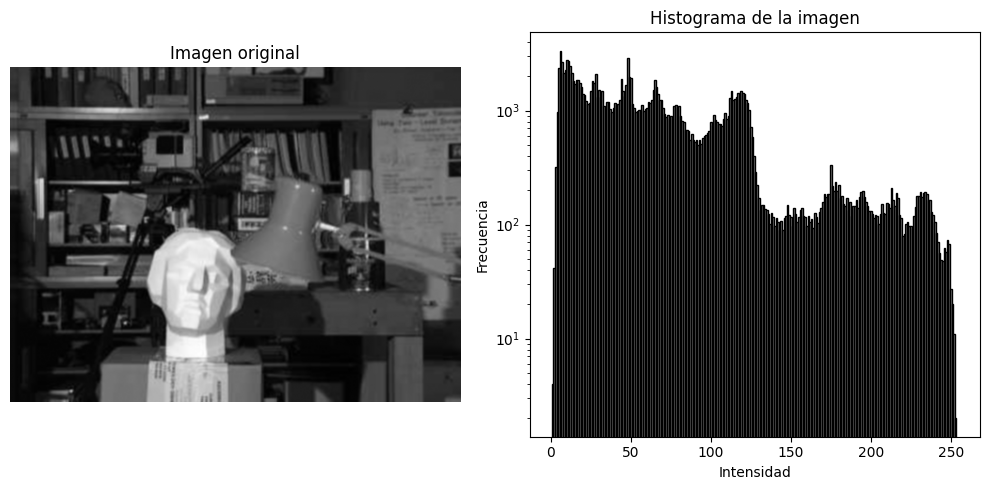

Intensidad promedia de la imagen:  68.4376334123056
Máxima varianza entre clases:  1963.149294162781
Umbral óptimo:  86


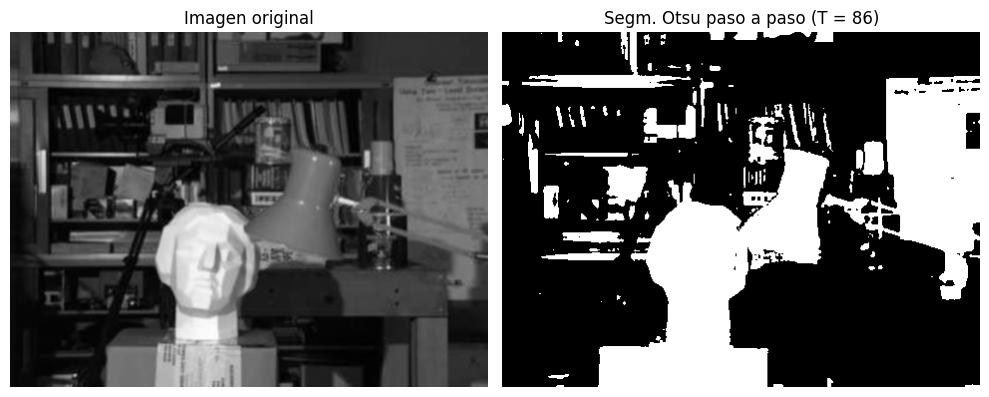

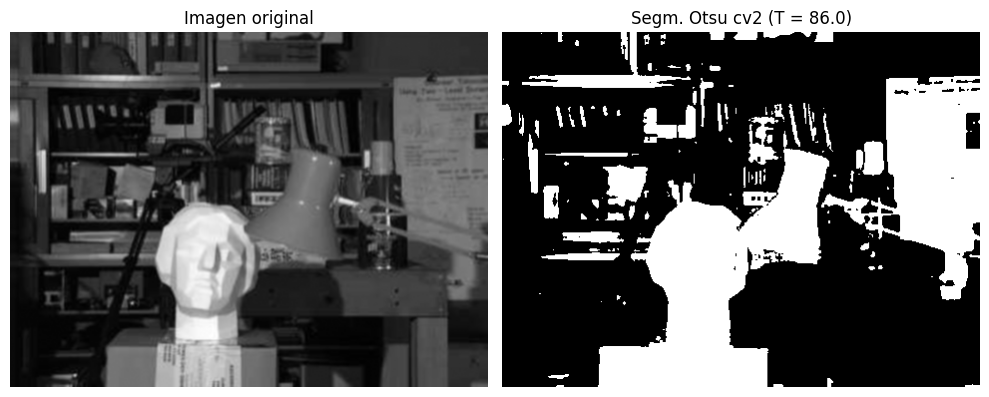

In [4]:
# Subir la imagen desde el sistema local
uploaded = files.upload()

# Leer la imagen en escala de grises
for filename in uploaded.keys():
    img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

# Mostrar la imagen original
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Imagen original")
plt.imshow(img, cmap='gray')
plt.axis('off')

# Calcular el histograma de la imagen
hist, bins = np.histogram(img.flatten(), bins=256, range=[0, 256])

# Mostrar el histograma
plt.subplot(1, 2, 2)
plt.title("Histograma de la imagen")
plt.bar(bins[:-1], hist, width=1, color='gray', edgecolor='black')
plt.yscale('log')  # Escala logarítmica en el eje Y
plt.xlabel("Intensidad")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Función para calcular el umbral óptimo utilizando el método de Otsu paso a paso
def otsu_thresholding(image):
    # Calcular el histograma
    hist, _ = np.histogram(image.flatten(), bins=256, range=[0, 256])
    prob = hist / hist.sum()

    # Calcular la media global (m_G)
    m_G = np.sum(np.arange(256) * prob)

    # Inicialización de variables
    max_variance = 0
    optimal_threshold = 0
    P1 = 0
    m_acc = 0

    # Iterar sobre todos los umbrales posibles
    for k in range(256):
        P1 += prob[k]  # Probabilidad acumulada P1(k)
        m_acc += k * prob[k]  # Media acumulada m(k)

        if P1 == 0 or P1 == 1:  # Evitar divisiones por cero
            continue

        # Calcular la varianza entre clases
        variance_between = ((m_G * P1 - m_acc) ** 2) / (P1 * (1 - P1))

        # Actualizar el umbral óptimo si encontramos una varianza mayor
        if variance_between > max_variance:
            max_variance = variance_between
            optimal_threshold = k
    print("Intensidad promedia de la imagen: ",m_G)
    print("Máxima varianza entre clases: ",max_variance)
    print("Umbral óptimo: ",optimal_threshold)

    return optimal_threshold

# Calcular el umbral óptimo utilizando el método de Otsu
optimal_threshold = otsu_thresholding(img)

# Aplicar el umbral a la imagen
segmented_image = np.where(img > optimal_threshold, 255, 0).astype(np.uint8)

# Mostrar la imagen segmentada y el umbral óptimo
plt.figure(figsize=(10, 5))

# Imagen original
plt.subplot(1, 2, 1)
plt.title("Imagen original")
plt.imshow(img, cmap='gray')
plt.axis('off')

# Imagen segmentada
plt.subplot(1, 2, 2)
plt.title(f"Segm. Otsu paso a paso (T = {optimal_threshold})")
plt.imshow(segmented_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

# ----------------------------------------------------------------------

################ Aplicar el método de Otsu utilizando OpenCV
_, otsu_threshold = cv2.threshold(img, 0, 255, cv2.THRESH_OTSU)

# Mostrar el valor del umbral calculado por Otsu
optimal_threshold = _  # El valor devuelto por cv2.threshold
# Mostrar la imagen segmentada
plt.figure(figsize=(10, 5))

# Imagen original
plt.subplot(1, 2, 1)
plt.title("Imagen original")
plt.imshow(img, cmap='gray')
plt.axis('off')

# Imagen segmentada con el método de Otsu
plt.subplot(1, 2, 2)
plt.title(f"Segm. Otsu cv2 (T = {optimal_threshold})")
plt.imshow(otsu_threshold, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

Umbrales óptimos para 3 clases: (63, 147)


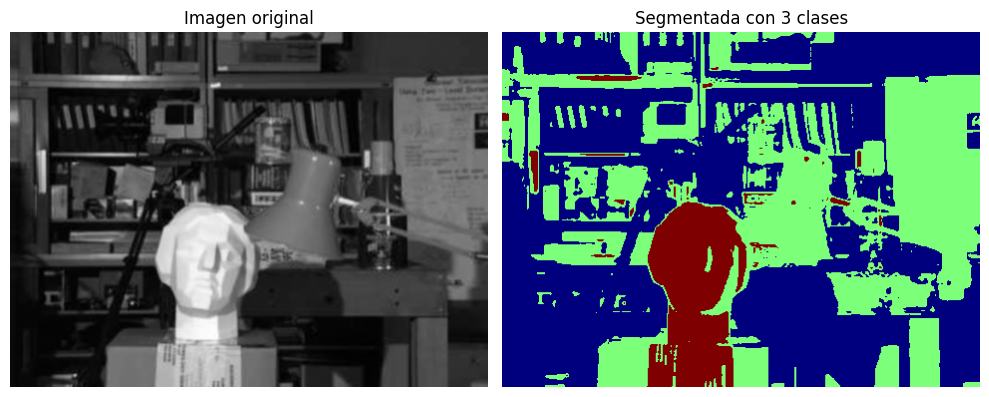

In [5]:
def otsu_k_classes(image, k):
    # Paso 1: Calcular el histograma normalizado
    hist, bins = np.histogram(image.flatten(), bins=256, range=[0, 256])
    prob = hist / hist.sum()

    # Media global
    m_G = np.sum(np.arange(256) * prob)

    # Inicialización de variables
    max_variance = 0
    optimal_thresholds = []

    # Generar todas las combinaciones de umbrales posibles (K-1 umbrales)
    thresholds = range(1, 256)  # Umbrales posibles entre 1 y 255
    for t in combinations(thresholds, k - 1):
        # Añadir límites de intensidad (0 y 256) a los umbrales
        t = (0,) + t + (256,)

        # Calcular P_k y m_k para cada clase
        P_k = []
        m_k = []
        for i in range(len(t) - 1):
            lower, upper = t[i], t[i + 1]
            P = prob[lower:upper].sum()  # Probabilidad acumulada
            m = np.sum(np.arange(lower, upper) * prob[lower:upper]) / P if P > 0 else 0  # Media acumulada
            P_k.append(P)
            m_k.append(m)

        # Calcular la varianza entre clases
        variance_between = sum([P_k[i] * (m_k[i] - m_G) ** 2 for i in range(k)])

        # Actualizar si encontramos una varianza mayor
        if variance_between > max_variance:
            max_variance = variance_between
            optimal_thresholds = t[1:-1]  # Excluir los límites 0 y 256

    return optimal_thresholds, max_variance

# Número de clases
k = 3  # Puedes cambiar este valor para probar con diferentes K

# Calcular los umbrales óptimos
optimal_thresholds, max_variance = otsu_k_classes(img, k)

# Mostrar resultados
print(f"Umbrales óptimos para {k} clases: {optimal_thresholds}")

# Segmentar la imagen
segmented_image = np.zeros_like(img)
thresholds = [0] + list(optimal_thresholds) + [256]
for i in range(len(thresholds) - 1):
    lower, upper = thresholds[i], thresholds[i + 1]
    segmented_image[(img >= lower) & (img < upper)] = i * (255 // (k - 1))

# Mostrar la imagen segmentada
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Imagen original")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f"Segmentada con {k} clases")
plt.imshow(segmented_image, cmap='jet')
plt.axis('off')

plt.tight_layout()
plt.show()

### Umbralización adapatativa

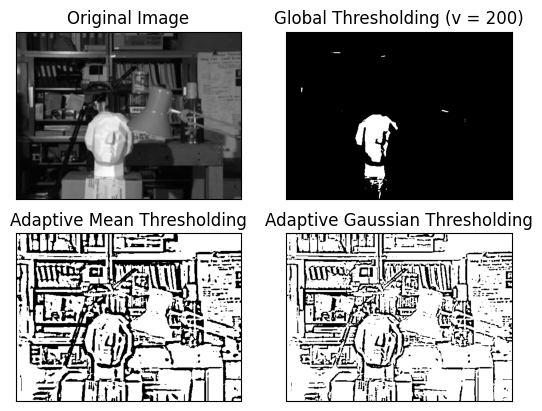

In [6]:
# # Subir la imagen desde el sistema local
# uploaded = files.upload()

# Leer la imagen en escala de grises
for filename in uploaded.keys():
    img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

img_denoise = cv2.medianBlur(img,1)
thresh = 200
ret,th1 = cv2.threshold(img_denoise,200,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img_denoise,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,15,6)
th3 = cv2.adaptiveThreshold(img_denoise,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,15,6)
titles = ['Original Image', f'Global Thresholding (v = {thresh})',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img_denoise, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

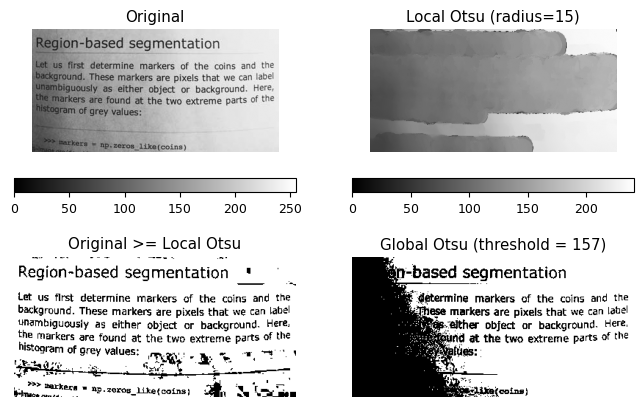

In [7]:
matplotlib.rcParams['font.size'] = 9

img = img_as_ubyte(data.page())

radius = 15
selem = disk(radius)

local_otsu = rank.otsu(img, selem)
threshold_global_otsu = threshold_otsu(img)
global_otsu = img >= threshold_global_otsu

fig, ax = plt.subplots(2, 2, figsize=(8, 5))
ax1, ax2, ax3, ax4 = ax.ravel()

fig.colorbar(ax1.imshow(img, cmap=plt.cm.gray),
           ax=ax1, orientation='horizontal')
ax1.set_title('Original')
ax1.axis('off')

fig.colorbar(ax2.imshow(local_otsu, cmap=plt.cm.gray),
           ax=ax2, orientation='horizontal')
ax2.set_title('Local Otsu (radius=%d)' % radius)
ax2.axis('off')

ax3.imshow(img >= local_otsu, cmap=plt.cm.gray)
ax3.set_title('Original >= Local Otsu' % threshold_global_otsu)
ax3.axis('off')

ax4.imshow(global_otsu, cmap=plt.cm.gray)
ax4.set_title('Global Otsu (threshold = %d)' % threshold_global_otsu)
ax4.axis('off')

plt.show()

array([[129,  84,  84, ..., 237, 237,   0],
       [ 84,  84,  84, ..., 237, 237,   0],
       [ 84,  84,  84, ..., 237, 237,   0],
       ...,
       [ 61,  61,  61, ..., 227, 227, 227],
       [ 61,  61,  61, ..., 227, 227, 227],
       [ 61,  61,  60, ..., 226, 227, 227]], dtype=uint8)
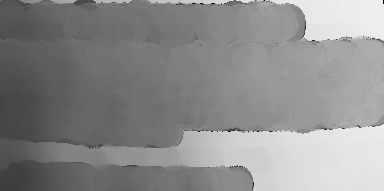

In [8]:
local_otsu

array([[136, 137, 139, ..., 239, 239, 239],
       [140, 139, 138, ..., 239, 239, 239],
       [142, 140, 137, ..., 239, 239, 239],
       ...,
       [ 47,  54,  50, ..., 225, 225, 225],
       [ 64,  68,  65, ..., 225, 225, 225],
       [ 63,  60,  57, ..., 225, 225, 225]], dtype=uint8)
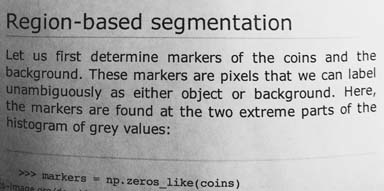

In [9]:
img

In [10]:
img >= local_otsu

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [False, False, False, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True, False, False, ..., False, False, False]])

<ipython-input-11-7fb409d71bc1>:6: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  denoised_img = median(img, morphology.square(kernel_size))
<ipython-input-11-7fb409d71bc1>:10: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  local_otsu = otsu(denoised_img, morphology.square(otsu_local_kernel_size))


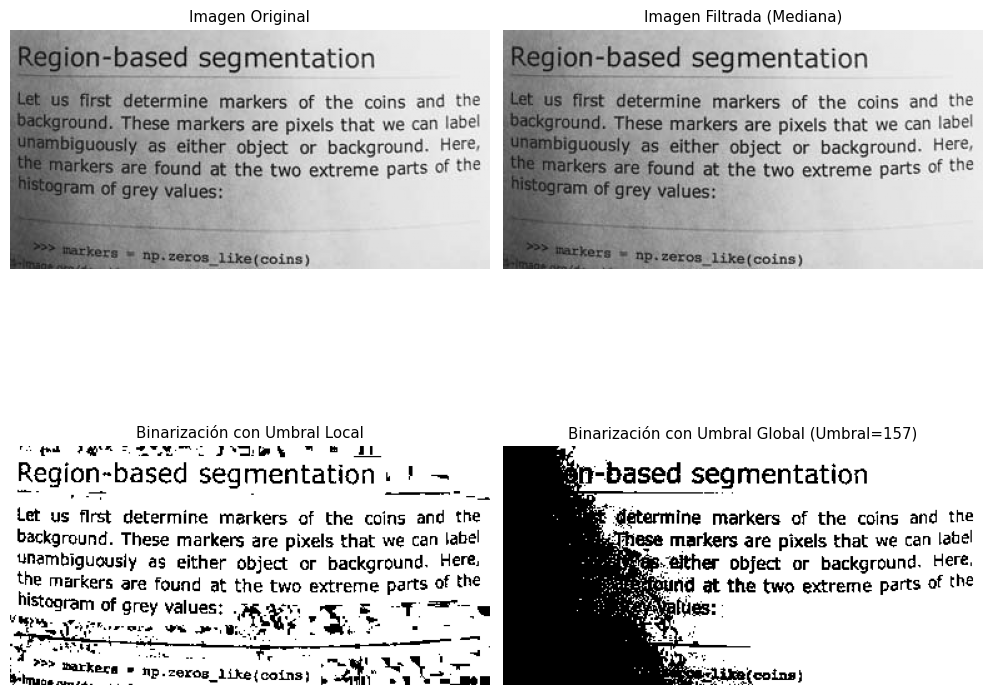

In [11]:
# Cargar imagen y convertir a 8 bits
img = img_as_ubyte(data.page())

# Aplicar un filtro de mediana para reducir ruido
kernel_size = 1  # Tamaño del kernel para el filtro de mediana
denoised_img = median(img, morphology.square(kernel_size))

# Calcular el umbral local de Otsu
otsu_local_kernel_size = 19  # Tamaño del kernel para el cálculo local de Otsu
local_otsu = otsu(denoised_img, morphology.square(otsu_local_kernel_size))

# Calcular el umbral global de Otsu
global_otsu_threshold = filters.threshold_otsu(denoised_img)
global_otsu = denoised_img >= global_otsu_threshold

# Visualizar resultados
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
ax[0, 0].imshow(img, cmap='gray')
ax[0, 0].set_title("Imagen Original")
ax[0, 0].axis('off')

ax[0, 1].imshow(denoised_img, cmap='gray')
ax[0, 1].set_title("Imagen Filtrada (Mediana)")
ax[0, 1].axis('off')

ax[1, 0].imshow(denoised_img >= local_otsu, cmap='gray')
ax[1, 0].set_title("Binarización con Umbral Local")
ax[1, 0].axis('off')

ax[1, 1].imshow(global_otsu, cmap='gray')
ax[1, 1].set_title(f"Binarización con Umbral Global (Umbral={global_otsu_threshold})")
ax[1, 1].axis('off')

plt.tight_layout()
plt.show()


# Segmentación basada en el crecimiento de regiones

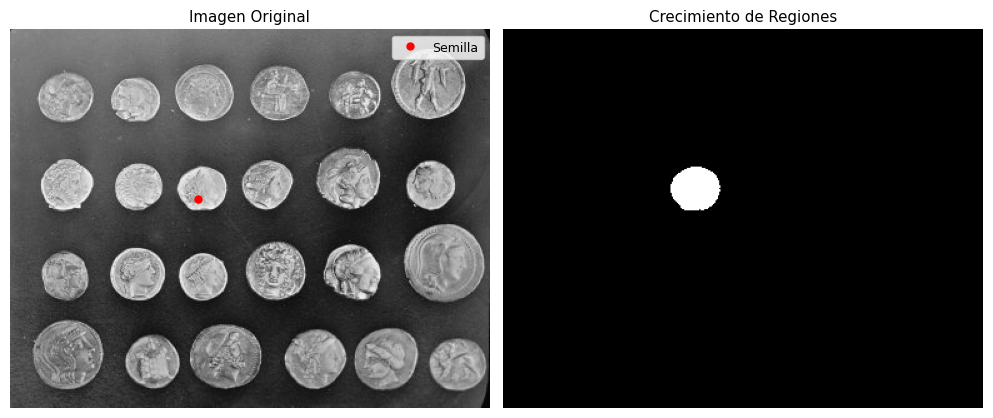

In [12]:
# Usar una imagen de ejemplo o subir una propia
image = img_as_ubyte(data.coins())  # Cambia esto si tienes una imagen propia

# Parámetros
seed = (135, 150)  # Cambiar según tu imagen (fila, columna)
threshold = 70

# Crecimiento de regiones
mask = flood(image, seed_point=seed, tolerance=threshold)

# Visualización
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Imagen original con el píxel semilla marcado
ax[0].imshow(image, cmap='gray')
ax[0].plot(seed[1], seed[0], 'ro', markersize=5, label='Semilla')  # Marcar semilla
ax[0].set_title("Imagen Original")
ax[0].axis('off')
ax[0].legend(loc='upper right')

# Máscara resultante
ax[1].imshow(mask, cmap='gray')
ax[1].set_title("Crecimiento de Regiones")
ax[1].axis('off')

plt.tight_layout()
plt.show()

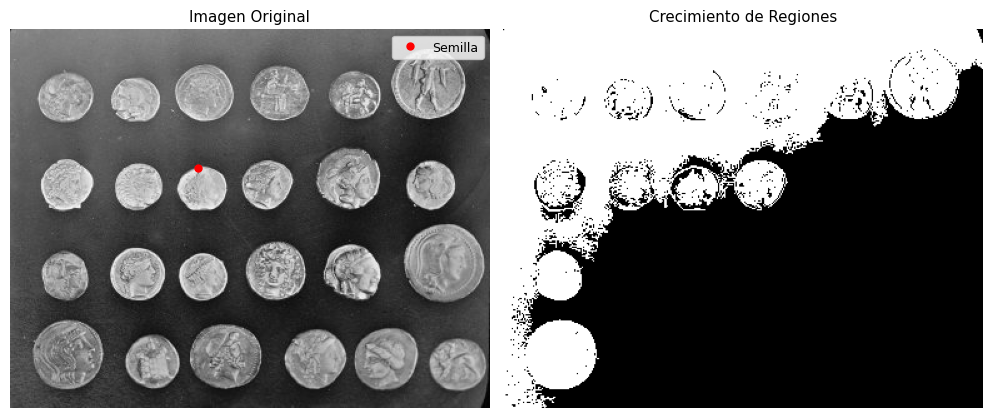

In [13]:
# Usar una imagen de ejemplo o subir una propia
image = img_as_ubyte(data.coins())  # Cambia esto si tienes una imagen propia

# Parámetros
seed = (110, 150)  # Cambiar según tu imagen (fila, columna)
threshold = 70

# Crecimiento de regiones
mask = flood(image, seed_point=seed, tolerance=threshold)

# Visualización
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Imagen original con el píxel semilla marcado
ax[0].imshow(image, cmap='gray')
ax[0].plot(seed[1], seed[0], 'ro', markersize=5, label='Semilla')  # Marcar semilla
ax[0].set_title("Imagen Original")
ax[0].axis('off')
ax[0].legend(loc='upper right')

# Máscara resultante
ax[1].imshow(mask, cmap='gray')
ax[1].set_title("Crecimiento de Regiones")
ax[1].axis('off')

plt.tight_layout()
plt.show()

## Uso del método Split & Merge

Saving demo_ split_merge.jpg to demo_ split_merge.jpg


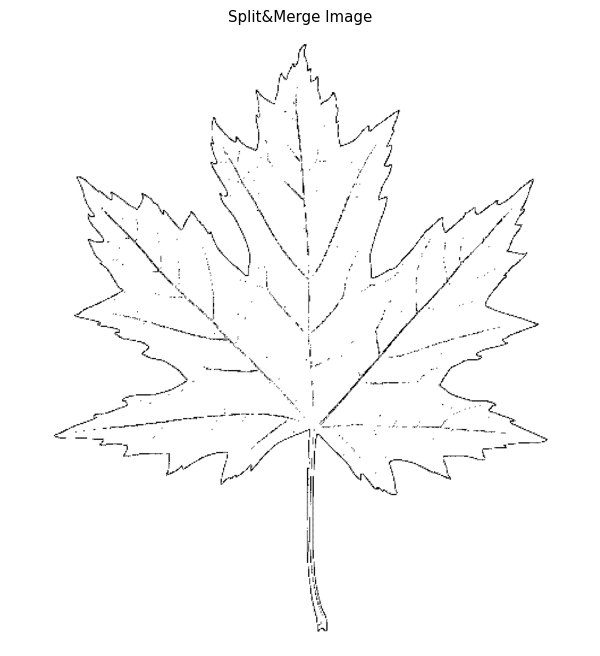

In [14]:
def is_homogeneous(region, threshold):
    """Check if the region is homogeneous based on the intensity threshold."""
    min_val, max_val = np.min(region), np.max(region)
    return (max_val - min_val) <= threshold

def split_and_merge(image, threshold):
    """Segment the image by recursively splitting and merging regions."""

    def recursive_split(region):
        rows, cols = region.shape
        if rows <= 1 or cols <= 1:
            return np.zeros_like(region, dtype=np.uint8)

        if is_homogeneous(region, threshold):
            return np.ones_like(region, dtype=np.uint8)

        # Split the region into four quadrants
        mid_row, mid_col = rows // 2, cols // 2

        # Ensure quadrants are correctly sized
        top_left = region[:mid_row, :mid_col]
        top_right = region[:mid_row, mid_col:]
        bottom_left = region[mid_row:, :mid_col]
        bottom_right = region[mid_row:, mid_col:]

        # Create empty segmented image of the same size
        segmented_quadrants = np.zeros_like(region, dtype=np.uint8)

        # Recursive splitting and assignment to segmented_quadrants
        segmented_quadrants[:mid_row, :mid_col] = recursive_split(top_left)
        segmented_quadrants[:mid_row, mid_col:] = recursive_split(top_right)
        segmented_quadrants[mid_row:, :mid_col] = recursive_split(bottom_left)
        segmented_quadrants[mid_row:, mid_col:] = recursive_split(bottom_right)

        return segmented_quadrants

    def merge_regions(segmented):
        """Merge adjacent regions if they are similar."""
        # Placeholder function for merging adjacent regions if needed
        return segmented

    # Ensure the image is grayscale
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply the region splitting and merging algorithm
    segmented_image = recursive_split(image)
    segmented_image = merge_regions(segmented_image)

    return segmented_image


# Usar una imagen de ejemplo
uploaded = files.upload()

# Leer la imagen en escala de grises
for filename in uploaded.keys():
    image = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

# Set the threshold for homogeneity
threshold = 50  # Adjust this value as needed

# Segment the image
result = split_and_merge(image, threshold)

# Save the segmented image
cv2.imwrite('Qsegmented_image.png', result * 255)

# Display the segmented image using Matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(result, cmap='gray')
plt.title('Split&Merge Image')
plt.axis('off')
plt.show()

## Segmentación Watersheed

### Binarización

Saving demo_watershed.png to demo_watershed.png


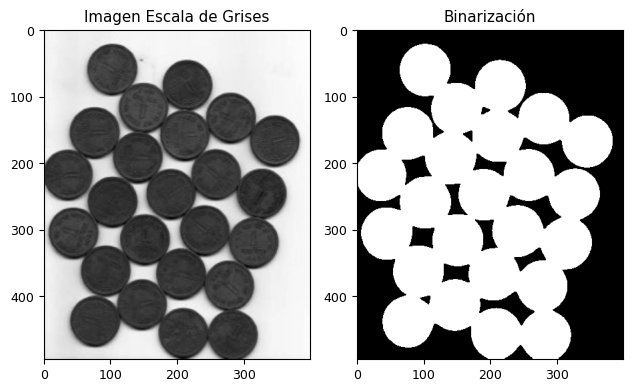

In [15]:
# Subir la imagen desde el sistema local
uploaded = files.upload()

# Leer el archivo subido
for filename in uploaded.keys():
    # Cargar la imagen en escala de grises
    img = cv2.imread(filename)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# Suavizado para reducir ruido
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# Segmentación con un umbral (Otsu) (umbral que maximiza la varianza entre las clases)
ret, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Mostrar resultados
plt.subplot(1, 2, 1)
plt.imshow(gray, cmap='gray')
plt.title('Imagen Escala de Grises')

plt.subplot(1, 2, 2)
plt.imshow(thresh, cmap='gray')
plt.title('Binarización')

plt.tight_layout()
plt.show()

## 2º Eliminación de ruido y suavizado de contornos mediante operador morfológico (apertura)
- Eliminación de ruido pequeño
- Suavizado de contornos
- Separar objetos

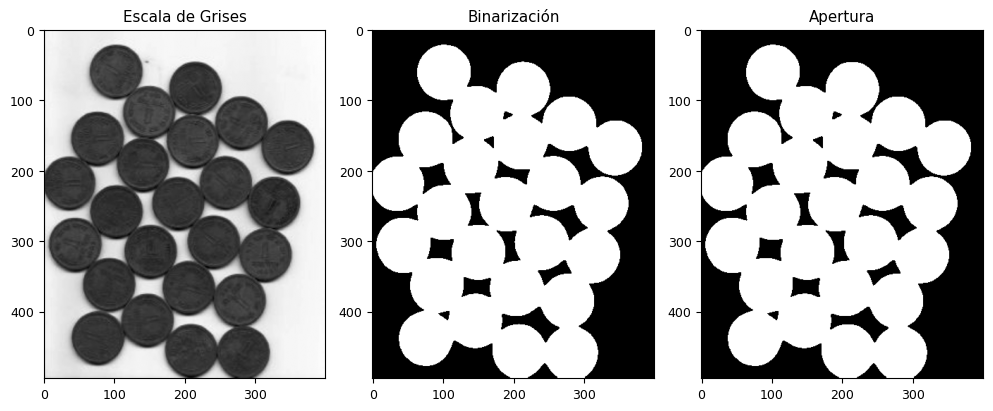

In [16]:
# Crear un kernel para la operación morfológica
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3)) # np.ones((3, 3), np.uint8)
# Aplicar gradiente morfológico de apertura
bin_img  = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# Mostrar resultados
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(gray, cmap='gray')
plt.title('Escala de Grises')

plt.subplot(1, 3, 2)
plt.imshow(thresh, cmap='gray')
plt.title('Binarización')

plt.subplot(1, 3, 3)
plt.imshow(bin_img , cmap='gray')
plt.title('Apertura')

plt.tight_layout()
plt.show()

## 3º Detección del fondo

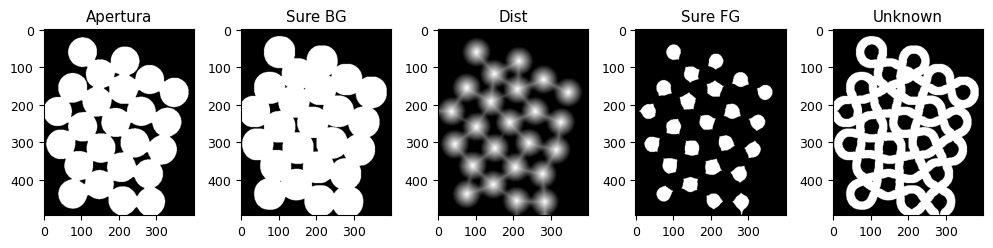

In [17]:
# sure background area: Representa las áreas del fondo que estamos seguros de que no pertenecen a ningún objeto.
sure_bg = cv2.dilate(bin_img, kernel, iterations=3)
# Distance transform   de una imagen binaria.
# La transformada de distancia mide la distancia mínima de cada píxel "blanco" (valor 255) al píxel "negro" más cercano (valor 0).
# Es especialmente útil para identificar regiones centrales dentro de objetos binarizados o para mejorar la segmentación en algoritmos como Watershed.
# Salida: Una imagen en escala de grises donde el valor de cada píxel representa la distancia mínima al fondo.
dist = cv2.distanceTransform(bin_img, cv2.DIST_L2, 5)
#foreground area: Representa las áreas de los objetos que estamos seguros de que pertenecen a ellos, sin ambigüedad.
ret, sure_fg = cv2.threshold(dist, 0.5 * dist.max(), 255, cv2.THRESH_BINARY)
sure_fg = sure_fg.astype(np.uint8)
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

# Mostrar resultados
plt.figure(figsize=(10, 5))

plt.subplot(1, 5, 1)
plt.imshow(bin_img, cmap='gray')
plt.title('Apertura')

plt.subplot(1, 5, 2)
plt.imshow(sure_bg, cmap='gray')
plt.title('Sure BG')

plt.subplot(1, 5, 3)
plt.imshow(dist , cmap='gray')
plt.title('Dist')

plt.subplot(1, 5, 4)
plt.imshow(sure_fg , cmap='gray')
plt.title('Sure FG')

plt.subplot(1, 5, 5)
plt.imshow(unknown , cmap='gray')
plt.title('Unknown')

plt.tight_layout()
plt.show()

## 4º Etiquetado

Número de regiones (incluyendo el fondo): 25


Text(0.5, 1.0, 'Seg Waterhsed')

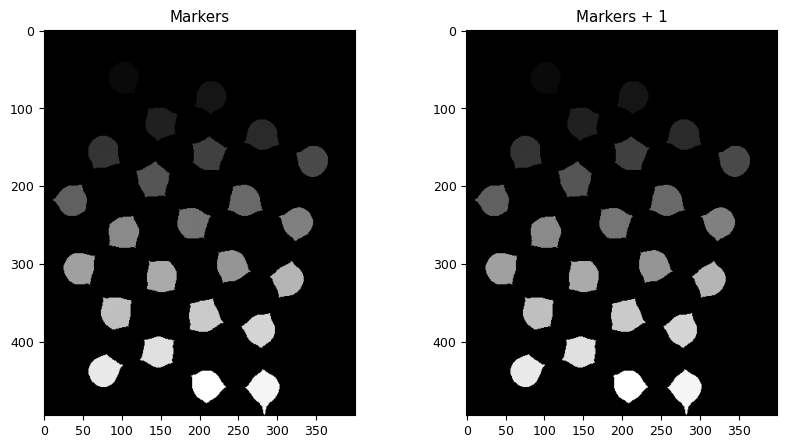

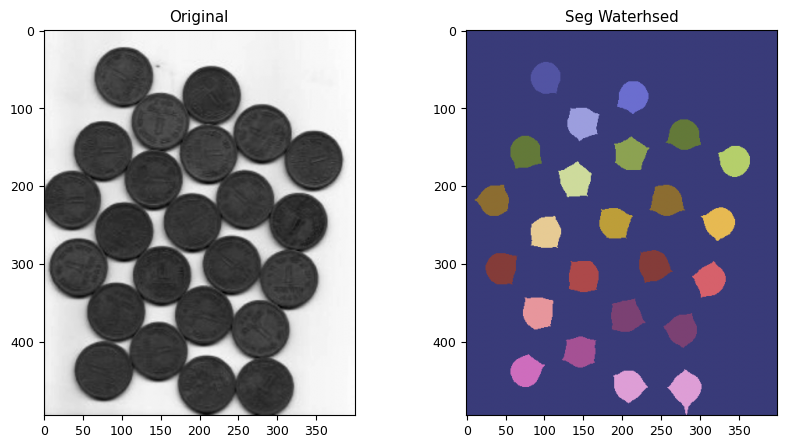

In [18]:
# Marker labelling: ret: Es el número total de etiquetas encontradas en la imagen, incluido el fondo (que siempre se etiqueta como 0).
ret, markers = cv2.connectedComponents(sure_fg)
print("Número de regiones (incluyendo el fondo):",ret)
# Mostrar resultados
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(markers, cmap='gray')
plt.title('Markers')

# En la matriz fondo aparece como 0, sumamos 1 a toda la matriz para que el fondo valga 1
markers = markers+1

plt.subplot(1, 2, 2)
plt.imshow(markers, cmap='gray')
plt.title('Markers + 1')

# Now, mark the region of unknown with zero Asigna el valor 0 a estas regiones en el mapa de marcadores. Esto indica que esas regiones son desconocidas y no están asociadas con ningún marcador existente.
markers[unknown==255] = 0

# Mostrar resultados
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(gray, cmap='gray')
plt.title('Original')

plt.subplot(1, 2, 2)
plt.imshow(markers, cmap='tab20b')
plt.title('Seg Waterhsed')

Text(0.5, 1.0, 'image segmented')

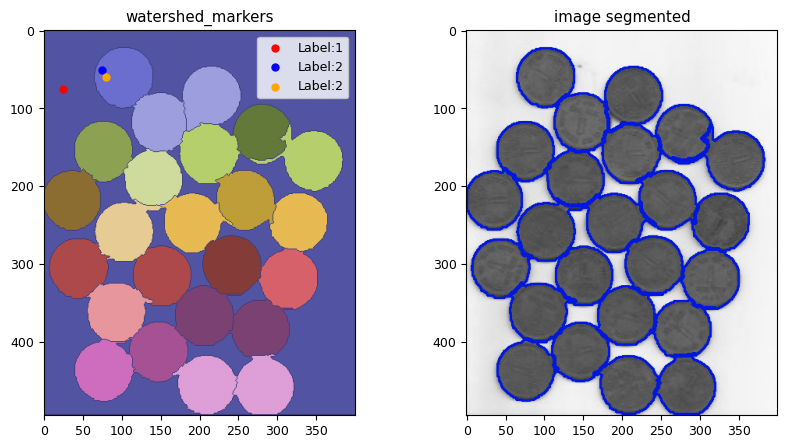

In [19]:
# watershed Algorithm
watershed_markers = cv2.watershed(img, markers)

# Mostrar resultados
plt.figure(figsize=(10, 5))
x=25
y=75
plt.subplot(1, 2, 1)
plt.imshow(watershed_markers, cmap="tab20b")
plt.scatter(x, y, color="red", s=25, label=f"Label:{watershed_markers[y,x]}")  # `s` define el tamaño del marcador
plt.scatter(75, 50, color="blue", s=25, label=f"Label:{watershed_markers[50,75]}")  # `s` define el tamaño del marcador
plt.scatter(80, 60, color="orange", s=25, label=f"Label:{watershed_markers[60,80]}")  # `s` define el tamaño del marcador


plt.title('watershed_markers')
plt.legend()


labels = np.unique(markers)

coins = []
# Un bucle itera sobre las etiquetas comenzando desde 2 (ignorando el fondo y las regiones desconocidas) para extraer los contornos de cada objeto.
for label in labels[2:]:

# Create a binary image in which only the area of the label is in the foreground
#and the rest of the image is in the background
    target = np.where(watershed_markers == label, 255, 0).astype(np.uint8)

  # Perform contour extraction on the created binary image
    contours, hierarchy = cv2.findContours(
        target, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    coins.append(contours[0])

# Draw the outline
img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img_rgb = cv2.drawContours(img_rgb, coins, -1, color=(0, 23, 223), thickness=2)

plt.subplot(1, 2, 2)
plt.imshow(img_rgb)
plt.title('image segmented')


## Segmentación con contornos activos

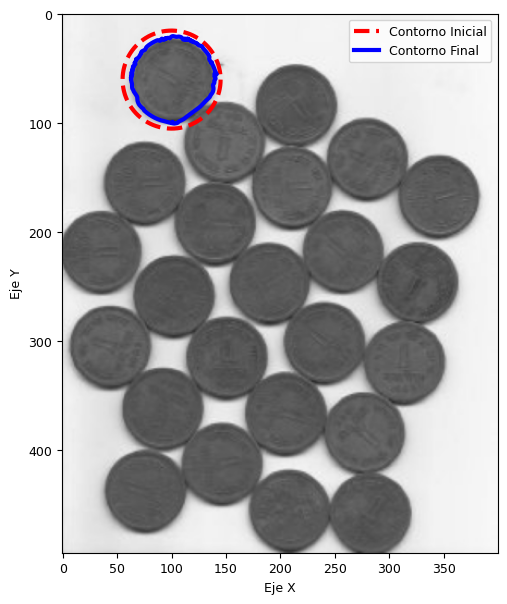

In [20]:
s = np.linspace(0, 2 * np.pi, 400)
r = 60 + 45 * np.sin(s) # Primer numero desplaza en vertical, segundo incrementa el tamaño en vertical
c = 100 + 45 * np.cos(s) # Primer numero desplaza en horizontal, segundo incrementa el tamaño en horizontal
init = np.array([r, c]).T

snake = active_contour(
    gaussian(img, sigma=3, preserve_range=False),
    init,
    alpha=0.015,    # Regularización de suavidad
    beta=10,        # Penalización por curvatura
    gamma=0.001,    # Tasa de actualización
)

# Visualizar el resultado
fig, ax = plt.subplots(figsize=(7, 7))
ax.imshow(img, cmap=plt.cm.gray)
ax.plot(init[:, 1], init[:, 0], '--r', lw=3, label="Contorno Inicial")
ax.plot(snake[:, 1], snake[:, 0], '-b', lw=3, label="Contorno Final")
ax.set_xlabel("Eje X")
ax.set_ylabel("Eje Y")
ax.legend()
plt.show()

# Ejemplo de un problema real haciendo uso de técnicas de segmentación clásicas

_Referencia:_ [Making Sense of Amazon Deforestation Patterns, NASA Earth Observatory](https://earthobservatory.nasa.gov/images/145888/making-sense-of-amazon-deforestation-patterns)

## Dependencias

In [22]:
import cv2
import imageio
import numpy as np
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt
from IPython.display import Image
from skimage.color import rgb2gray
from sklearn.cluster import KMeans
from skimage import filters, morphology
from skimage.exposure import equalize_hist
from skimage.filters import threshold_local

## Carga de la imagen

Saving deforestacion.gif to deforestacion (2).gif


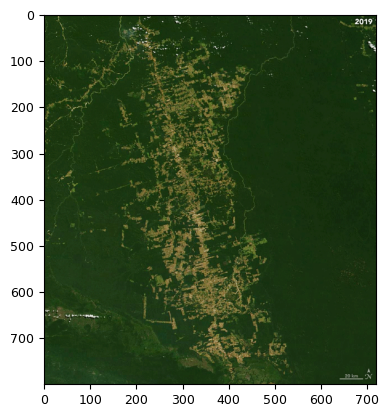

In [34]:
uploaded = files.upload()

for filename in uploaded.keys():
    gif_path = filename

imagenes = [img[..., :3] if img.shape[-1] == 4 else img for img in imageio.mimread(gif_path)]
imagenes_gris = [rgb2gray(img) for img in imagenes]
plt.imshow(imagenes[-1])

## Mejora del contraste

In [24]:
imagenes_eq = [equalize_hist(img) for img in imagenes_gris]

## Segmentación de la imágen haciendo uso de diferentes métodos de umbralización

### Método de OTSU

In [25]:
umbral_otsu = [filters.threshold_otsu(img) for img in imagenes_eq]
segmentadas_otsu = [(img > umbral).astype(np.uint8) for img, umbral in zip(imagenes_eq, umbral_otsu)]

### Segmentación adaptativa

In [26]:
umbral_adaptativo = [threshold_local(img, block_size=15, offset=0) for img in imagenes_eq]
segmentadas_adaptativas = [(img > umbral).astype(np.uint8) for img, umbral in zip(imagenes_eq, umbral_adaptativo)]

### Umbral adaptativo

In [27]:
imagenes_eq_uint8 = [(img * 255).astype(np.uint8) for img in imagenes_eq]
segmentadas_umbral_adaptativo = [cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2) for img in imagenes_eq_uint8]

### Segmentación por K-Means

In [28]:
def segmentacion_kmeans(img, n_clusters=2):
    img_reshaped = img.reshape((-1, 1))
    kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10).fit(img_reshaped)
    segmented_img = kmeans.labels_.reshape(img.shape[:2])
    cluster_0_count = np.sum(segmented_img == 0)
    cluster_1_count = np.sum(segmented_img == 1)
    if cluster_0_count > cluster_1_count:
        segmented_img = 1 - segmented_img
    segmented_img = 1 - segmented_img
    return segmented_img.astype(np.uint8)

segmentadas_kmeans = [segmentacion_kmeans(img) for img in imagenes_gris]

### Refinamiento de la segmentación haciendo uso de operaciones morfológicas

In [29]:
segmentadas_ref_otsu = [morphology.remove_small_objects(img.astype(bool), 100).astype(np.uint8) for img in segmentadas_otsu]
segmentadas_ref_adaptativas = [morphology.remove_small_objects(img.astype(bool), 100).astype(np.uint8) for img in segmentadas_adaptativas]
segmentadas_ref_umbral_adaptativo = [morphology.remove_small_objects(img.astype(bool), 100).astype(np.uint8) for img in segmentadas_umbral_adaptativo]
segmentadas_ref_kmeans = [morphology.remove_small_objects(img.astype(bool), 100).astype(np.uint8) for img in segmentadas_kmeans]

## Calculo del área de deforestación

In [30]:
factor_escala = (20 / 51) ** 2
areas_deforestadas_otsu = [np.sum(img) * factor_escala for img in segmentadas_ref_otsu]
areas_deforestadas_adaptativas = [np.sum(img) * factor_escala for img in segmentadas_ref_adaptativas]
areas_deforestadas_umbral = [np.sum(img) * factor_escala for img in segmentadas_ref_umbral_adaptativo]
areas_deforestadas_kmeans = [np.sum(img) * factor_escala for img in segmentadas_ref_kmeans]

## Evolución del área de deforestación para cada método utilizado

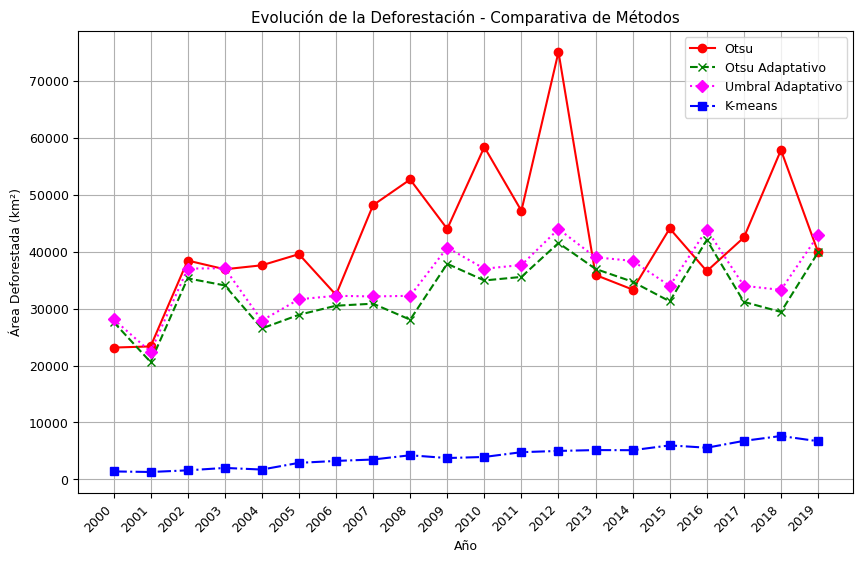

In [31]:
years = list(range(2000, 2020))
plt.figure(figsize=(10, 6))
plt.plot(years, areas_deforestadas_otsu, marker='o', linestyle='-', color='red', label='Otsu')
plt.plot(years, areas_deforestadas_adaptativas, marker='x', linestyle='--', color='green', label='Otsu Adaptativo')
plt.plot(years, areas_deforestadas_umbral, marker='D', linestyle=':', color='magenta', label='Umbral Adaptativo')
plt.plot(years, areas_deforestadas_kmeans, marker='s', linestyle='-.', color='blue', label='K-means')
plt.xlabel('Año')
plt.ylabel('Área Deforestada (km²)')
plt.title('Evolución de la Deforestación - Comparativa de Métodos')
plt.xticks(years, rotation=45, ha='right')
plt.legend()
plt.grid()
plt.show()

## Porcentaje de incremento de la deforestación por metodo y por año

In [32]:
df_resultados = pd.DataFrame({
    "Método": ["Otsu", "Otsu Adaptativo", "Umbral Adaptativo", "K-Means"],
    "Área Inicial (km²)": [
        areas_deforestadas_otsu[0],
        areas_deforestadas_adaptativas[0],
        areas_deforestadas_umbral[0],
        areas_deforestadas_kmeans[0]
    ],
    "Área Final (km²)": [
        areas_deforestadas_otsu[-1],
        areas_deforestadas_adaptativas[-1],
        areas_deforestadas_umbral[-1],
        areas_deforestadas_kmeans[-1]
    ],
    "Incremento (%)": [
        ((areas_deforestadas_otsu[-1] - areas_deforestadas_otsu[0]) / areas_deforestadas_otsu[0]) * 100,
        ((areas_deforestadas_adaptativas[-1] - areas_deforestadas_adaptativas[0]) / areas_deforestadas_adaptativas[0]) * 100,
        ((areas_deforestadas_umbral[-1] - areas_deforestadas_umbral[0]) / areas_deforestadas_umbral[0]) * 100,
        ((areas_deforestadas_kmeans[-1] - areas_deforestadas_kmeans[0]) / areas_deforestadas_kmeans[0]) * 100
    ]
})
print(tabulate(df_resultados, headers="keys", tablefmt="grid", floatfmt=".2f", stralign="center", numalign="center", showindex=False))

+-------------------+----------------------+--------------------+------------------+
|      Método       |  Área Inicial (km²)  |  Área Final (km²)  |  Incremento (%)  |
+===================+======================+====================+==================+
|       Otsu        |       23149.56       |      39924.49      |      72.46       |
+-------------------+----------------------+--------------------+------------------+
|  Otsu Adaptativo  |       27653.52       |      39846.98      |      44.09       |
+-------------------+----------------------+--------------------+------------------+
| Umbral Adaptativo |       28141.18       |      42838.14      |      52.23       |
+-------------------+----------------------+--------------------+------------------+
|      K-Means      |       1405.31        |      6710.50       |      377.51      |
+-------------------+----------------------+--------------------+------------------+


## Muestra de los resultados

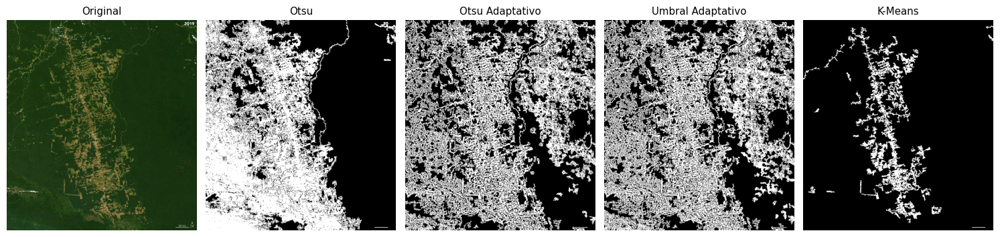

In [33]:
fig, axes = plt.subplots(1, 5, figsize=(15, 5))
axes[0].imshow(imagenes[-1])
axes[0].set_title("Original")
axes[0].axis("off")
axes[1].imshow(segmentadas_ref_otsu[-1], cmap='gray')
axes[1].set_title("Otsu")
axes[1].axis("off")
axes[2].imshow(segmentadas_ref_adaptativas[-1], cmap='gray')
axes[2].set_title("Otsu Adaptativo")
axes[2].axis("off")
axes[3].imshow(segmentadas_ref_umbral_adaptativo[-1], cmap='gray')
axes[3].set_title("Umbral Adaptativo")
axes[3].axis("off")
axes[4].imshow(segmentadas_ref_kmeans[-1], cmap='gray')
axes[4].set_title("K-Means")
axes[4].axis("off")
plt.tight_layout()
plt.show()

## Muestra cualitativa de los resultados de cada método

In [35]:
imageio.mimsave('/content/segmentacion_otsu.gif', [img * 255 for img in segmentadas_ref_otsu], duration=10.0)
imageio.mimsave('/content/segmentacion_otsu_adaptativo.gif', [img * 255 for img in segmentadas_ref_adaptativas], duration=10.0)
imageio.mimsave('/content/segmentacion_umbral_adaptativo.gif', [img * 255 for img in segmentadas_ref_umbral_adaptativo], duration=10.0)
imageio.mimsave('/content/segmentacion_kmeans.gif', [img * 255 for img in segmentadas_ref_kmeans], duration=10.0)

## Resultados

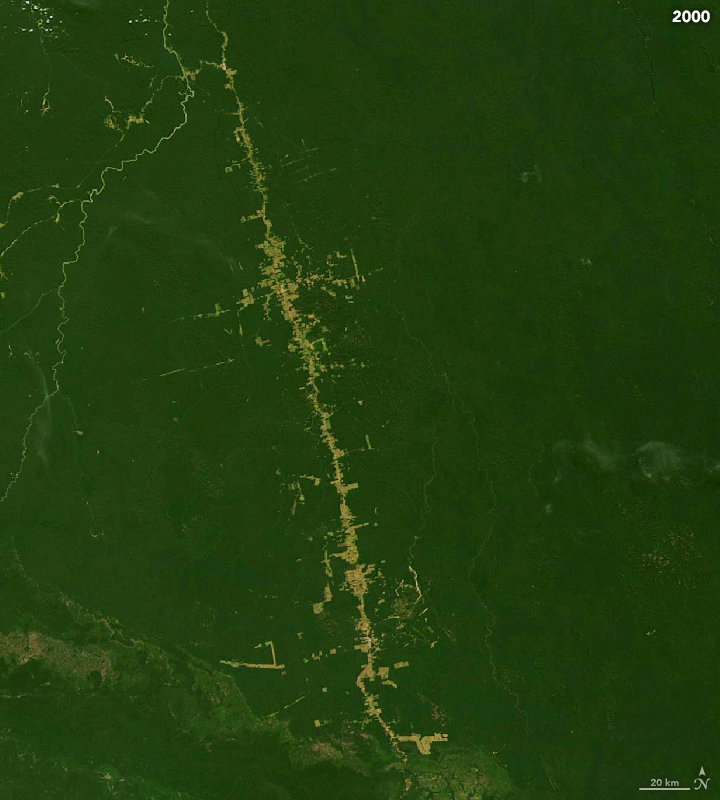

In [36]:
Image(filename='/content/deforestacion.gif')

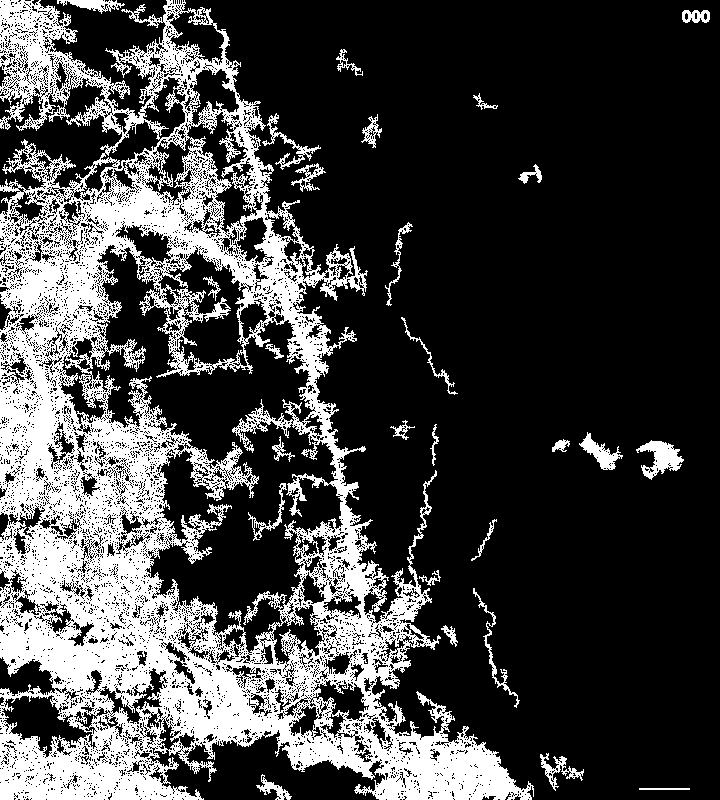

In [37]:
Image(filename='/content/segmentacion_otsu.gif')

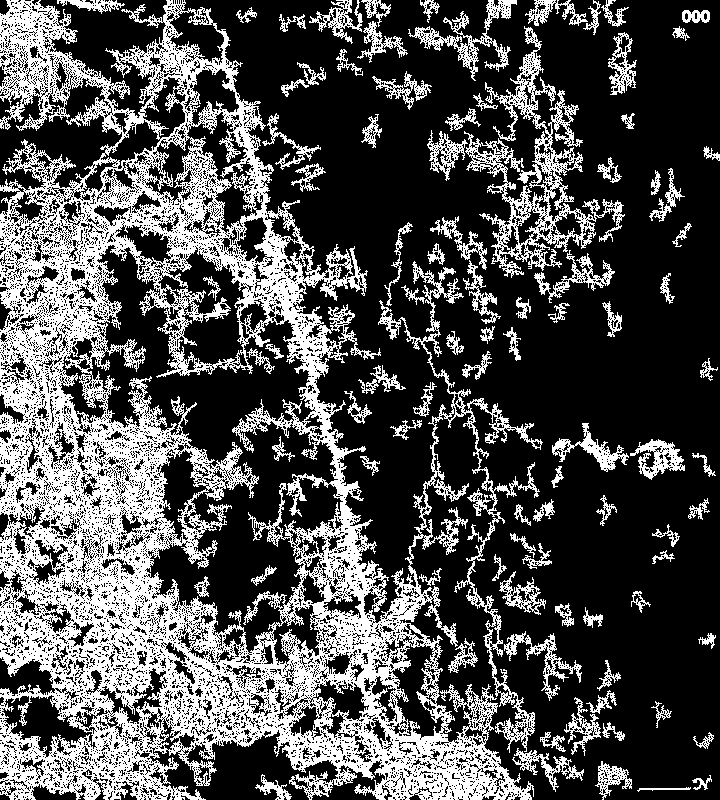

In [38]:
Image(filename='/content/segmentacion_otsu_adaptativo.gif')

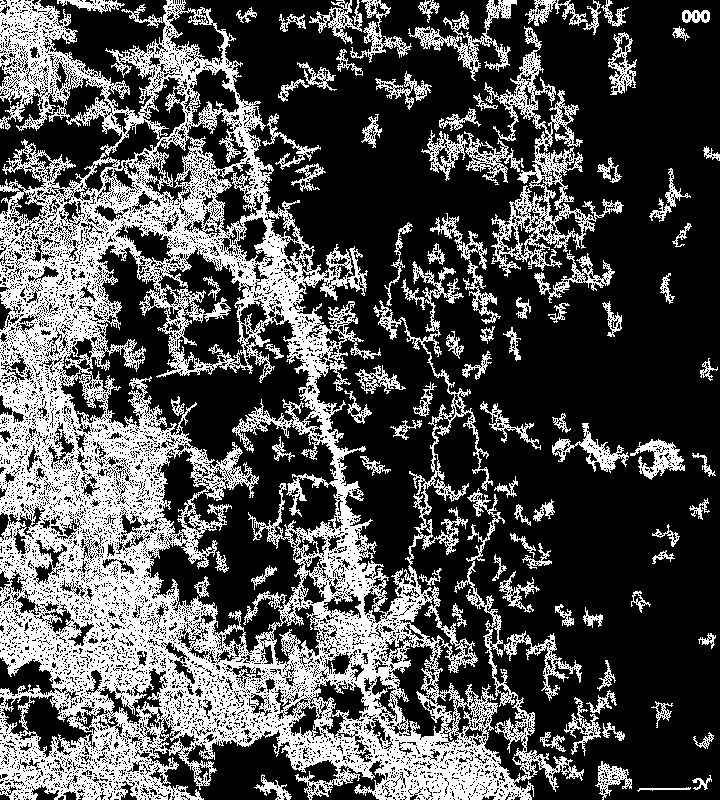

In [39]:
Image(filename='/content/segmentacion_umbral_adaptativo.gif')

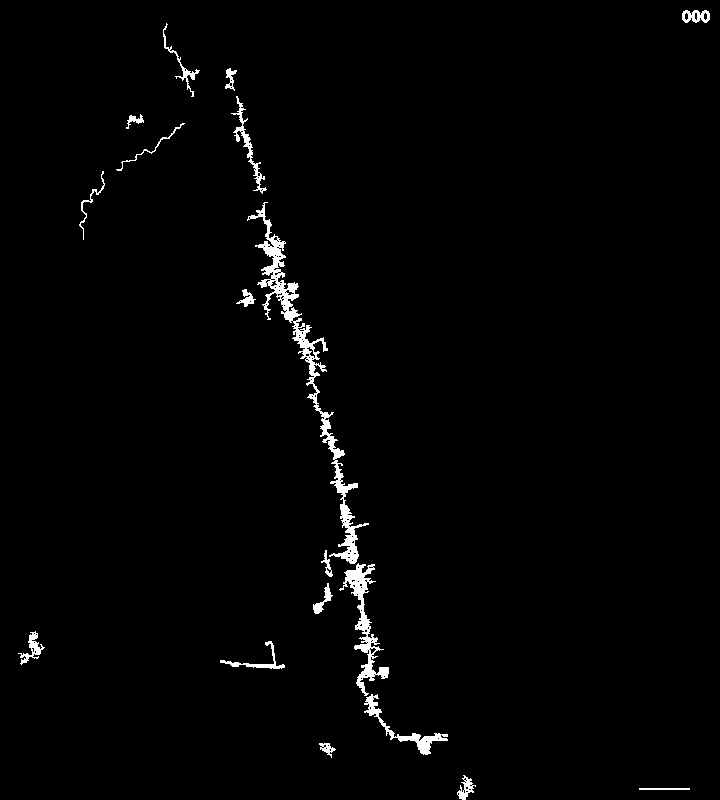

In [40]:
Image(filename='/content/segmentacion_kmeans.gif')